# image retraining

*or, how to retrain an image classifier for new categories*

following [this](https://www.tensorflow.org/tutorials/image_retraining)

In [1]:
import numpy as np
import tensorflow as tf

import utils

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


in this tutorial we will use the `tensorflow` hub, which I'm pretty stoked about

In [2]:
!pip install --user pyasn1

In [3]:
!pip install --user tensorflow-hub

## training on flowers

let's go get flower images

In [ ]:
!curl -LO http://download.tensorflow.org/example_images/flower_photos.tgz

In [ ]:
!tar xzf flower_photos.tgz

In [ ]:
!rm flower_photos.tgz

we will be using code directly from the tensorflow hub examples directory. we will download one particular file, which is also available [here](https://github.com/tensorflow/hub/blob/master/examples/image_retraining/retrain.py)

In [ ]:
!curl -LO https://github.com/tensorflow/hub/raw/r0.1/examples/image_retraining/retrain.py

there are a ton of options and it's worth looking at them before we run

In [ ]:
!python retrain.py -h

we will eventually want to investigate as much as we can via `tensorboard`, so it's good to create a directory for saving `tensorboard`-able stuff and figure out which flags should direct output to that directory.

In [ ]:
!mkdir -p ~/tmp/flowers

the following code will take about a half hour per the documentation. we will submit it now and then go about our business of reviewing the code.

**BEFORE YOU RUN**: `summaries_dir` below will be **recursively deleted**. so be careful!

**BEFORE YOU RUN**: `summaries_dir` below will be **recursively deleted**. so be careful!

**BEFORE YOU RUN**: `summaries_dir` below will be **recursively deleted**. so be careful!

**BEFORE YOU RUN**: `summaries_dir` below will be **recursively deleted**. so be careful!

**BEFORE YOU RUN**: `summaries_dir` below will be **recursively deleted**. so be careful!

In [ ]:
!python retrain.py --image_dir flower_photos/ --summaries_dir /home/zlamberty/tmp/flowers/

In [ ]:
ll

### code review

while that's running, let's go over the code. here's a breakdown of the `main` function in `retrain.py`:

1. simple validation (verify / manipulate images, create directories, etc)
1. set up a pre-trained graph
1. add a new layer to the pre-trained graph
1. calculate all "bottleneck" image summaries
1. prepare for training
1. train
1. eval

#### `FLAGS`

this is an annoying thing a lot of `tensorflow` code seems to do -- encapsulate all commandline args to a program-global `FLAGS` namespace which must by definition be recreated with the `argparse` module. let's do that here one time to avoid the hassle of hard-coding a bunch of stuff

In [4]:
import argparse

In [5]:
parser = argparse.ArgumentParser()
parser.add_argument(
    '--image_dir',
    type=str,
    default='',
    help='Path to folders of labeled images.'
)
parser.add_argument(
    '--output_graph',
    type=str,
    default='/tmp/output_graph.pb',
    help='Where to save the trained graph.'
)
parser.add_argument(
    '--intermediate_output_graphs_dir',
    type=str,
    default='/tmp/intermediate_graph/',
    help='Where to save the intermediate graphs.'
)
parser.add_argument(
    '--intermediate_store_frequency',
    type=int,
    default=0,
    help="""\
       How many steps to store intermediate graph. If "0" then will not
       store.\
    """
)
parser.add_argument(
    '--output_labels',
    type=str,
    default='/tmp/output_labels.txt',
    help='Where to save the trained graph\'s labels.'
)
parser.add_argument(
    '--summaries_dir',
    type=str,
    default='/tmp/retrain_logs',
    help='Where to save summary logs for TensorBoard.'
)
parser.add_argument(
    '--how_many_training_steps',
    type=int,
    default=4000,
    help='How many training steps to run before ending.'
)
parser.add_argument(
    '--learning_rate',
    type=float,
    default=0.01,
    help='How large a learning rate to use when training.'
)
parser.add_argument(
    '--testing_percentage',
    type=int,
    default=10,
    help='What percentage of images to use as a test set.'
)
parser.add_argument(
    '--validation_percentage',
    type=int,
    default=10,
    help='What percentage of images to use as a validation set.'
)
parser.add_argument(
    '--eval_step_interval',
    type=int,
    default=10,
    help='How often to evaluate the training results.'
)
parser.add_argument(
    '--train_batch_size',
    type=int,
    default=100,
    help='How many images to train on at a time.'
)
parser.add_argument(
    '--test_batch_size',
    type=int,
    default=-1,
    help="""\
    How many images to test on. This test set is only used once, to evaluate
    the final accuracy of the model after training completes.
    A value of -1 causes the entire test set to be used, which leads to more
    stable results across runs.\
    """
)
parser.add_argument(
    '--validation_batch_size',
    type=int,
    default=100,
    help="""\
    How many images to use in an evaluation batch. This validation set is
    used much more often than the test set, and is an early indicator of how
    accurate the model is during training.
    A value of -1 causes the entire validation set to be used, which leads to
    more stable results across training iterations, but may be slower on large
    training sets.\
    """
)
parser.add_argument(
    '--print_misclassified_test_images',
    default=False,
    help="""\
    Whether to print out a list of all misclassified test images.\
    """,
    action='store_true'
)
parser.add_argument(
    '--bottleneck_dir',
    type=str,
    default='/tmp/bottleneck',
    help='Path to cache bottleneck layer values as files.'
)
parser.add_argument(
    '--final_tensor_name',
    type=str,
    default='final_result',
    help="""\
    The name of the output classification layer in the retrained graph.\
    """
)
parser.add_argument(
    '--flip_left_right',
    default=False,
    help="""\
    Whether to randomly flip half of the training images horizontally.\
    """,
    action='store_true'
)
parser.add_argument(
    '--random_crop',
    type=int,
    default=0,
    help="""\
    A percentage determining how much of a margin to randomly crop off the
    training images.\
    """
)
parser.add_argument(
    '--random_scale',
    type=int,
    default=0,
    help="""\
    A percentage determining how much to randomly scale up the size of the
    training images by.\
    """
)
parser.add_argument(
    '--random_brightness',
    type=int,
    default=0,
    help="""\
    A percentage determining how much to randomly multiply the training image
    input pixels up or down by.\
    """
)
parser.add_argument(
    '--tfhub_module',
    type=str,
    default=(
        'https://tfhub.dev/google/imagenet/inception_v3/feature_vector/1'),
    help="""\
    Which TensorFlow Hub module to use.
    See https://github.com/tensorflow/hub/blob/master/docs/modules/image.md
    for some publicly available ones.\
    """)
parser.add_argument(
    '--saved_model_dir',
    type=str,
    default='',
    help='Where to save the exported graph.')
FLAGS, unparsed = parser.parse_known_args()

In [6]:
# my particulars:
FLAGS.image_dir = 'flower_photos/'
FLAGS.summaries_dir = '/home/zlamberty/tmp/flowers/'

and, update the `retrain` module `FLAGS` item

In [7]:
import retrain, importlib

importlib.reload(retrain)

retrain.FLAGS = FLAGS

#### simple validation (verify / manipulate images, create directories, etc)

the actual code that does this is:

```python
# Needed to make sure the logging output is visible.
# See https://github.com/tensorflow/tensorflow/issues/3047
tf.logging.set_verbosity(tf.logging.INFO)

if not FLAGS.image_dir:
    tf.logging.error('Must set flag --image_dir.')
    return -1

# Prepare necessary directories that can be used during training
prepare_file_system()

# Look at the folder structure, and create lists of all the images.
image_lists = create_image_lists(
    FLAGS.image_dir, FLAGS.testing_percentage, FLAGS.validation_percentage
)
class_count = len(image_lists.keys())
if class_count == 0:
    tf.logging.error('No valid folders of images found at ' + FLAGS.image_dir)
    return -1
if class_count == 1:
    tf.logging.error('Only one valid folder of images found at ' +
                     FLAGS.image_dir +
                     ' - multiple classes are needed for classification.')
    return -1

# See if the command-line flags mean we're applying any distortions.
do_distort_images = should_distort_images(
    FLAGS.flip_left_right, FLAGS.random_crop, FLAGS.random_scale,
    FLAGS.random_brightness
)
```

In [8]:
image_lists = retrain.create_image_lists(
    FLAGS.image_dir, FLAGS.testing_percentage, FLAGS.validation_percentage
)

INFO:tensorflow:Looking for images in 'daisy'
INFO:tensorflow:Looking for images in 'dandelion'
INFO:tensorflow:Looking for images in 'roses'
INFO:tensorflow:Looking for images in 'sunflowers'
INFO:tensorflow:Looking for images in 'tulips'


In [9]:
image_lists.keys()

odict_keys(['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips'])

In [10]:
image_lists['daisy'].keys()

dict_keys(['testing', 'dir', 'training', 'validation'])

In [11]:
image_lists['daisy']['testing'][:10]

['4890424315_6a59696357_n.jpg',
 '2408024540_37f0be7cc0_n.jpg',
 '3494265422_9dba8f2191_n.jpg',
 '14600779226_7bbc288d40_m.jpg',
 '1265350143_6e2b276ec9.jpg',
 '4563059851_45a9d21a75.jpg',
 '4222584034_8964cbd3de.jpg',
 '15784493690_b1858cdb2b_n.jpg',
 '7454630692_ab2d67dd18_m.jpg',
 '3483303007_42e3f90da7.jpg']

simple enough there.

we are not distoring our images, but you have the ability to crop, skew, etc the images for generalizable training

#### set up a pre-trained graph

here we actually make use of the `tensorflow_hub` library to load an existing module (the inception v3 module)

In [12]:
import tensorflow_hub as hub

In [13]:
module_spec = hub.load_module_spec(FLAGS.tfhub_module)

INFO:tensorflow:Using /tmp/tfhub_modules to cache modules.


In [14]:
type(module_spec)

tensorflow_hub.native_module._ModuleSpec

in the code, we create the `hub.native_module._ModuleSpec` objectd `module_spec` above, and then pass it to this function:

```python
def create_module_graph(module_spec):
  """Creates a graph and loads Hub Module into it.
  Args:
    module_spec: the hub.ModuleSpec for the image module being used.
  Returns:
    graph: the tf.Graph that was created.
    bottleneck_tensor: the bottleneck values output by the module.
    resized_input_tensor: the input images, resized as expected by the module.
    wants_quantization: a boolean, whether the module has been instrumented
      with fake quantization ops.
  """
  height, width = hub.get_expected_image_size(module_spec)
  with tf.Graph().as_default() as graph:
    resized_input_tensor = tf.placeholder(tf.float32, [None, height, width, 3])
    m = hub.Module(module_spec)
    bottleneck_tensor = m(resized_input_tensor)
    wants_quantization = any(node.op in FAKE_QUANT_OPS
                             for node in graph.as_graph_def().node)
  return graph, bottleneck_tensor, resized_input_tensor, wants_quantization
```

it is clear from this definition that the `hub.Module` function takes a module specification (generally it seems that "specification" is `tensorflow`-ese for a dressed-up protocol buffer) and builds an actual model. let's try it out

In [15]:
height, width = hub.get_expected_image_size(module_spec)

note: this is from the shape of the tensors in the input info dict, possible (or some related internal implementation function):

In [16]:
module_spec.get_input_info_dict()

{'images': <hub.ParsedTensorInfo shape=(?, 299, 299, 3) dtype=float32 is_sparse=False>}

In [17]:
height

299

In [18]:
width

299

In [19]:
from retrain import FAKE_QUANT_OPS

In [20]:
with tf.Graph().as_default() as graph:
    resized_input_tensor = tf.placeholder(tf.float32, [None, height, width, 3])
    m = hub.Module(module_spec)
    bottleneck_tensor = m(resized_input_tensor)
    wants_quantization = any(
        node.op in FAKE_QUANT_OPS
        for node in graph.as_graph_def().node
    )

INFO:tensorflow:Initialize variable module/InceptionV3/Conv2d_1a_3x3/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Conv2d_1a_3x3/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Conv2d_1a_3x3/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Conv2d_1a_3x3/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Conv2d_1a_3x3/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Conv2d_1a_3x3/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Conv2d_1a_3x3/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Conv2d_1a_3x3/weights
INFO:tensorflow:Initialize variable module/InceptionV3

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5b/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5b/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5b/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5b/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5b/Branch_2/Conv2d_0a_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5b/Branch_2/Conv2d_0a_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5b/Branch_2/Conv2d_0b_3x3/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff4215

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5c/Branch_2/Conv2d_0a_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5c/Branch_2/Conv2d_0a_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5c/Branch_2/Conv2d_0b_3x3/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5c/Branch_2/Conv2d_0b_3x3/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5c/Branch_2/Conv2d_0b_3x3/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5c/Branch_2/Conv2d_0b_3x3/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5c/Branch_2/Conv2d_0b_3x3/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variab

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5d/Branch_2/Conv2d_0b_3x3/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5d/Branch_2/Conv2d_0b_3x3/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5d/Branch_2/Conv2d_0b_3x3/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5d/Branch_2/Conv2d_0b_3x3/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5d/Branch_2/Conv2d_0c_3x3/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_5d/Branch_2/Conv2d_0c_3x3/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_5d/Branch_2/Conv2d_0c_3x3/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/va

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_1/Conv2d_0a_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6b/Branch_1/Conv2d_0a_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_1/Conv2d_0b_1x7/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff4215

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_2/Conv2d_0e_1x7/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6b/Branch_2/Conv2d_0e_1x7/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_3/Conv2d_0b_1x1/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6b/Branch_3/Conv2d_0b_1x1/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_3/Conv2d_0b_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6b/Branch_3/Conv2d_0b_1x1/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6b/Branch_3/Conv2d_0b_1x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variab

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6c/Branch_2/Conv2d_0c_1x7/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6c/Branch_2/Conv2d_0c_1x7/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6c/Branch_2/Conv2d_0c_1x7/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6c/Branch_2/Conv2d_0c_1x7/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6c/Branch_2/Conv2d_0d_7x1/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6c/Branch_2/Conv2d_0d_7x1/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6c/Branch_2/Conv2d_0d_7x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/va

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6d/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6d/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6d/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6d/Branch_2/Conv2d_0a_1x1/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6d/Branch_2/Conv2d_0a_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6d/Branch_2/Conv2d_0a_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6d/Branch_2/Conv2d_0b_7x1/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff4215

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6e/Branch_1/Conv2d_0a_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6e/Branch_1/Conv2d_0a_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6e/Branch_1/Conv2d_0b_1x7/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6e/Branch_1/Conv2d_0b_1x7/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6e/Branch_1/Conv2d_0b_1x7/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6e/Branch_1/Conv2d_0b_1x7/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6e/Branch_1/Conv2d_0b_1x7/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variab

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6e/Branch_3/Conv2d_0b_1x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6e/Branch_3/Conv2d_0b_1x1/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_6e/Branch_3/Conv2d_0b_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_6e/Branch_3/Conv2d_0b_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7a/Branch_0/Conv2d_0a_1x1/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7a/Branch_0/Conv2d_0a_1x1/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7a/Branch_0/Conv2d_0a_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/va

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7b/Branch_1/Conv2d_0a_1x1/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7b/Branch_1/Conv2d_0a_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7b/Branch_1/Conv2d_0a_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7b/Branch_1/Conv2d_0b_1x3/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff4215

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7b/Branch_3/Conv2d_0b_1x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7b/Branch_3/Conv2d_0b_1x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7c/Branch_0/Conv2d_0a_1x1/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7c/Branch_0/Conv2d_0a_1x1/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7c/Branch_0/Conv2d_0a_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7c/Branch_0/Conv2d_0a_1x1/BatchNorm/moving_mean
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7c/Branch_0/Conv2d_0a_1x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variab

INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7c/Branch_2/Conv2d_0d_3x1/BatchNorm/moving_variance:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7c/Branch_2/Conv2d_0d_3x1/BatchNorm/moving_variance
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7c/Branch_2/Conv2d_0d_3x1/weights:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7c/Branch_2/Conv2d_0d_3x1/weights
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7c/Branch_3/Conv2d_0b_1x1/BatchNorm/beta:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/variables/variables' with InceptionV3/Mixed_7c/Branch_3/Conv2d_0b_1x1/BatchNorm/beta
INFO:tensorflow:Initialize variable module/InceptionV3/Mixed_7c/Branch_3/Conv2d_0b_1x1/BatchNorm/moving_mean:0 from checkpoint b'/tmp/tfhub_modules/11d9faf945d073033780fd924b2b09ff42155763/va

In [21]:
utils.show_graph(graph)

In [22]:
bottleneck_tensor

<tf.Tensor 'module_apply_default/hub_output/feature_vector/SpatialSqueeze:0' shape=(?, 2048) dtype=float32>

so that tensor is a 2048-element embedding of the input images that was defined in the InceptionV3 module, and it is *that* embedding we will use as the base representation of our flower image in our transfer learning module

#### add a new layer to the pre-trained graph

in order to make our flower-specific predictions, we need to build out the network to incorporate them. we do that with the following code block

```python
# Add the new layer that we'll be training.
with graph.as_default():
  (train_step, cross_entropy, bottleneck_input,
   ground_truth_input, final_tensor) = add_final_retrain_ops(
       class_count, FLAGS.final_tensor_name, bottleneck_tensor,
       wants_quantization, is_training=True)
```

##### `add_final_retrain_ops`

the lifting here is done in

```python
def add_final_retrain_ops(class_count, final_tensor_name, bottleneck_tensor,
                          quantize_layer, is_training):
  """Adds a new softmax and fully-connected layer for training and eval.
  
  We need to retrain the top layer to identify our new classes, so this function
  adds the right operations to the graph, along with some variables to hold the
  weights, and then sets up all the gradients for the backward pass.
  
  The set up for the softmax and fully-connected layers is based on:
  https://www.tensorflow.org/tutorials/mnist/beginners/index.html
  
  Args:
    class_count: Integer of how many categories of things we're trying to
        recognize.
    final_tensor_name: Name string for the new final node that produces results.
    bottleneck_tensor: The output of the main CNN graph.
    quantize_layer: Boolean, specifying whether the newly added layer should be
        instrumented for quantization with TF-Lite.
    is_training: Boolean, specifying whether the newly add layer is for training
        or eval.
        
  Returns:
    The tensors for the training and cross entropy results, and tensors for the
    bottleneck input and ground truth input
  """
  ...
```

the body of that function is long and complicated but we'll pick out the important parts.

first, we create some placeholders with the expected shapes:

```python
batch_size, bottleneck_tensor_size = bottleneck_tensor.get_shape().as_list()
assert batch_size is None, 'We want to work with arbitrary batch size.'
with tf.name_scope('input'):
    bottleneck_input = tf.placeholder_with_default(
        bottleneck_tensor,
        shape=[batch_size, bottleneck_tensor_size],
        name='BottleneckInputPlaceholder'
    )

ground_truth_input = tf.placeholder(
    tf.int64, [batch_size], name='GroundTruthInput'
)
```

after this, we go on to *manually* create a linearization layer, and tag the weights and biases for this to have advanced summary statistics.

important things we're doing here:

1. using `tf.name_scope` to keep summary items in separated scopes
1. using summary operations wrapped up in one large `variable_summaries` function to record summaries for `tensorboard`

```python
# Organizing the following ops so they are easier to see in TensorBoard.
layer_name = 'final_retrain_ops'
with tf.name_scope(layer_name):
    with tf.name_scope('weights'):
        initial_value = tf.truncated_normal(
            [bottleneck_tensor_size, class_count], stddev=0.001
        )
        layer_weights = tf.Variable(initial_value, name='final_weights')
        variable_summaries(layer_weights)
    
    with tf.name_scope('baises'):
        layer_biases = tf.Variable(tf.zeros([class_count]), name='final_biases')
        variable_summaries(layer_biases)
    
    with tf.name_scope('Wx_plus_b'):
        logits = tf.matmul(bottleneck_input, layer_weights) + layer_biases
        tf.summary.histogram('pre_activations', logits)
```

the function `variable_summaries` used above is simple (in fact, a good enough idea that we may wish to steal it for `eripy` extensions)

```python
def variable_summaries(var):
    """Attach a lot of summaries to a Tensor (for TensorBoard visualization)."""
    with tf.name_scope('summaries'):
        mean = tf.reduce_mean(var)
        tf.summary.scalar('mean', mean)
        with tf.name_scope('stddev'):
            sttdev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
        tf.summary.scalar('stddev', stddev)
        tf.summary.scalar('max', tf.reduce_max(var))
        tf.summary.scalar('min', tf.reduce_min(var))
        tf.summary.histogram('histogram', var)
```

the final addition is an activation layer, taking those linearized outputs and applying a softmax. we also grab a histogram of activation values:

```python
final_tensor = tf.nn.softmax(logits, name=final_tensor_name)
# quantization if requested
tf.summary.histogram('activations', final_tensor)
```

at this point, if we are not training we are done and can return the graph.

if we *are* training, we create the training operations as well:

```python
with tf.name_scope('cross_entropy'):
    cross_entropy_mean = tf.losses.sparse_softmax_cross_entropy(
        labels=ground_truth_input, logits=logits
    )

tf.summary.scalar('cross_entropy', cross_entropy_mean)

with tf.name_scope('train'):
    optimizer = tf.train.GradientDescentOptimizer(FLAGS.learning_rate)
    train_step = optimizer.minimize(cross_entropy_mean)
```

let's actually apply all of the above steps by calling the function as-is from the `retrain` module:

In [23]:
class_count = len(image_lists.keys())
with graph.as_default():
    (train_step, cross_entropy, bottleneck_input,
     ground_truth_input, final_tensor) = retrain.add_final_retrain_ops(
        class_count, FLAGS.final_tensor_name, bottleneck_tensor,
        wants_quantization, is_training=True)

now, check out the tensors and operations added after those steps

In [24]:
utils.show_graph(graph)

simple enough! we have a black-box InceptionV3 model which passes records through an `input` layer, adds retraining operations, then calculates cross entropy and trains

#### calculate all "bottleneck" image summaries

speaking of that black-box InceptionV3 model: every pass through the training/testing/evaluating datasets will involve passing the input jpeg through the *fixed* InceptionV3 model. this is very wasteful!

the authors deal with this by caching the bottleneck embeddings of these images one time. this is the majority of the work done here. as of writing, I'm still not sure how they inform the training ops to use these as inputs -- tbd.

in any case, the block which calculates the cached bottleneck embeddings is

```python
cache_bottlenecks(sess, image_lists, FLAGS.image_dir,
                  FLAGS.bottleneck_dir, jpeg_data_tensor,
                  decoded_image_tensor, resized_image_tensor,
                  bottleneck_tensor, FLAGS.tfhub_module)
```

full code:

In [25]:
retrain.cache_bottlenecks??

note that the way we invoke it those cached files are written out to

In [26]:
FLAGS.bottleneck_dir

'/tmp/bottleneck'

we already ran this code once bruh

In [27]:
ll /tmp/bottleneck/

total 572
drwxr-xr-x 2 zlamberty  98304 Jul 11 14:29 daisy/
drwxr-xr-x 2 zlamberty 143360 Jul 11 14:31 dandelion/
drwxr-xr-x 2 zlamberty  98304 Jul 11 14:33 roses/
drwxr-xr-x 2 zlamberty 114688 Jul 11 14:34 sunflowers/
drwxr-xr-x 2 zlamberty 122880 Jul 11 14:36 tulips/


In [28]:
import os

In [29]:
sunflower_bottleneck_dir = '/tmp/bottleneck/sunflowers'
sunflower_bottleneck_files = os.listdir(sunflower_bottleneck_dir)
print(len(sunflower_bottleneck_files))
sunflower_bottleneck_files[:5]

699


['8929274876_17efc1774a_n.jpg_https~tfhub.dev~google~imagenet~inception_v3~feature_vector~1.txt',
 '2895404754_6d9f9416d7_n.jpg_https~tfhub.dev~google~imagenet~inception_v3~feature_vector~1.txt',
 '16656015339_2ccb7cd18d.jpg_https~tfhub.dev~google~imagenet~inception_v3~feature_vector~1.txt',
 '9610098411_f1613c8e14.jpg_https~tfhub.dev~google~imagenet~inception_v3~feature_vector~1.txt',
 '14244273988_a7484f18b7_m.jpg_https~tfhub.dev~google~imagenet~inception_v3~feature_vector~1.txt']

these files are raw txt and very simple:

In [30]:
with open(os.path.join(sunflower_bottleneck_dir, sunflower_bottleneck_files[0])) as fp:
    x = [float(_) for _ in fp.read().split(',')]

In [31]:
x[:10]

[0.1355082,
 0.2254975,
 0.36527458,
 0.050829843,
 0.10437409,
 0.07182149,
 0.08753048,
 0.5620216,
 0.19128509,
 0.45568806]

#### prepare for training

there are a few items tossed in to this section:

1. we create evaluation steps attached to the final tensor (something to actually pass into `sess.run`)
1. we create a `tf.summary.FileWriter` for writing `tensorboard` summary ops
    1. separate writer for `train` and `validation`, living in separate folders
1. we create a `tf.train.Saver` object for restoring and exporting model checkpoints while training

#### train

the train loop is very simple. for each loop:

1. load random cached bottlenecks with the `get_random_cached_bottlenecks` functions (this is how we get input tensors, I get it now)
1. run the summary and train step operations in our session with the `bottleneck_input` and `ground_truth_input` placeholders being set to the randomly selected samples from the previous step

this is actually pretty cool and clever.

after the loop is finished we write out that state of the model with the `tf.train.Saver` object to a global `CHECKPOINT_NAME`:

In [32]:
retrain.CHECKPOINT_NAME

'/tmp/_retrain_checkpoint'

In [33]:
ll /tmp/_retr*

-rw-r--r-- 1 zlamberty 87252116 Jul 11 14:40 /tmp/_retrain_checkpoint.data-00000-of-00001
-rw-r--r-- 1 zlamberty    17086 Jul 11 14:40 /tmp/_retrain_checkpoint.index
-rw-r--r-- 1 zlamberty  3975996 Jul 11 14:40 /tmp/_retrain_checkpoint.meta


#### eval

the `run_final_eval` function is the last thing called in `main`, and it simply loads a random sampling of the cached bottleneck for the testing directory. with those, it performs a simple evaluation operation and reports test accuracy

## bottlenecks

see above -- we pre-calculate all of the embeddings from InceptionV3 so that we don't have to re-calculate them while training our transfer learning layer

## training

yadda yadda

## visualizing the retraining with tensorboard

go run (on the base server)

```
CUDA_VISIBLE_DEVICES= tensorboard --logdir /path/to/your/summaries_dir
```

and navigate to http://eri-gpu:6006/

thoughts:

1. the InceptionV3 is so huge. it's laughable.
1. why are there three save operations?

## using the retrained model

one of the last steps in the training stage above was to write out a checkpoint model:

In [34]:
ll /tmp/output_graph.pb

-rw-r--r-- 1 zlamberty 87523054 Jul 11 14:41 /tmp/output_graph.pb


and a set of output labels to boot:

In [35]:
ll /tmp/output_labels.txt

-rw-r--r-- 1 zlamberty 40 Jul 11 14:41 /tmp/output_labels.txt


In [37]:
cat /tmp/output_labels.txt

daisy
dandelion
roses
sunflowers
tulips


the tutorial then points to another github-hosted file [label_image.py](https://github.com/tensorflow/tensorflow/blob/master/tensorflow/examples/label_image/label_image.py) (part of the tensorflow core repo).

the suggestion is that we should be able to download that file and then run it, directing it to use our checkpointed model / labels and to score any of our existing flower images:

In [38]:
!curl -LO https://github.com/tensorflow/tensorflow/raw/master/tensorflow/examples/label_image/label_image.py

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   175  100   175    0     0    483      0 --:--:-- --:--:-- --:--:--   483
100  4707  100  4707    0     0   7581      0 --:--:-- --:--:-- --:--:--  7581


we will use our trained flower model to make a prediction based on this file:

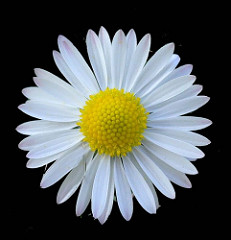

In [40]:
panda_file = 'flower_photos/daisy/21652746_cc379e0eea_m.jpg'
from IPython.display import Image
Image(filename=panda_file)

so probably should say daisy, no?

In [39]:
!python label_image.py --graph=/tmp/output_graph.pb --labels=/tmp/output_labels.txt --input_layer=Placeholder --output_layer=final_result --image=flower_photos/daisy/21652746_cc379e0eea_m.jpg

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
2018-07-11 19:23:34.810239: I tensorflow/core/platform/cpu_feature_guard.cc:140] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2018-07-11 19:23:34.811536: E tensorflow/stream_executor/cuda/cuda_driver.cc:406] failed call to cuInit: CUDA_ERROR_NO_DEVICE
2018-07-11 19:23:34.811562: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:152] no NVIDIA GPU device is present: /dev/nvidia0 does not exist
daisy 0.99799275
sunflowers 0.001137953
dandelion 0.0004593753
tulips 0.00033321764
roses 7.676755e-05


let's do what we do -- review that `label_image.py` file. stages:

1. load the graph from `/tmp/output_graph.pb`
1. read the image file as a tensor
1. pull out an input and output tensor from the loaded graph
1. `sess.run` the output with a `feed_dict` mapping the input placeholder to the loaded file tensor
1. print the results

this is actually *very* simple

loading the graph:

```python
def load_graph(model_file):
    graph = tf.Graph()
    graph_def = tf.GraphDef()
  
    with open(model_file, "rb") as f:
        graph_def.ParseFromString(f.read())
          
    with graph.as_default():
        tf.import_graph_def(graph_def)
  
    return graph
```

and reading the image to a tensor is only complicated because of the different image types supported:

```python
def read_tensor_from_image_file(file_name,
                                input_height=299,
                                input_width=299,
                                input_mean=0,
                                input_std=255):
  input_name = "file_reader"
  output_name = "normalized"
  file_reader = tf.read_file(file_name, input_name)
  if file_name.endswith(".png"):
    image_reader = tf.image.decode_png(
        file_reader, channels=3, name="png_reader")
  elif file_name.endswith(".gif"):
    image_reader = tf.squeeze(
        tf.image.decode_gif(file_reader, name="gif_reader"))
  elif file_name.endswith(".bmp"):
    image_reader = tf.image.decode_bmp(file_reader, name="bmp_reader")
  else:
    image_reader = tf.image.decode_jpeg(
        file_reader, channels=3, name="jpeg_reader")
  float_caster = tf.cast(image_reader, tf.float32)
  dims_expander = tf.expand_dims(float_caster, 0)
  resized = tf.image.resize_bilinear(dims_expander, [input_height, input_width])
  normalized = tf.divide(tf.subtract(resized, [input_mean]), [input_std])
  sess = tf.Session()
  result = sess.run(normalized)

  return result
```

## training on your own categories

if you had your own folders in your own directory structure e.g.

In [42]:
ll flower_photos/

total 616
-rw-r----- 1 zlamberty 418049 Feb  9  2016 LICENSE.txt
drwx------ 2 zlamberty  36864 Feb 10  2016 daisy/
drwx------ 2 zlamberty  57344 Feb 10  2016 dandelion/
drwx------ 2 zlamberty  36864 Feb 10  2016 roses/
drwx------ 2 zlamberty  36864 Feb 10  2016 sunflowers/
drwx------ 2 zlamberty  40960 Feb 10  2016 tulips/


you could re-train the same model to your own labels

## creating a set of training images

general advice on creating a collection of training examples

## training steps

change the training steps to train for longer; accuracy goes up until it doesn't

## distortions

generalizability via cropping, scaling, brightness altering, flipping, etc

## hyper-parameters

they mention two hps, both accessible as cli flags: `--learning_rate` and `--train_batch_size`

## training, validation, and testing sets

parameterizable via `--testing_percentage` and `--validation_percentage`

current default implementation is to randomly select from validation as well as training -- why would I ever do that? can be changed by setting `--validation_batch_size=-1`

also, misclassified examples can be accessed directly with the flag `--print_misclassified_test_images`

## other model architectures

this particular script was written in such a way that the actual hub module is parameterized as well, accessible from the cli with the flag `--tfhub_module`. this is pretty clever and something I should remember... doesn't feel like it's super easy to generalize to non-tfhub modules though?

maybe the more general approach is to write code that can load any graph `.pb` file, and then write a helper which uses `tensorflow_hub` to build a graph from a model and save the `.pb` in a usable location?

# summary

we did a lot of code review here, but the basic idea is simple: you can download major effot models using `tensorflow_hub` and you can easily set up transfer learning exercises after you've done that